## Preparing data
We need to prepare the data for the model. This includes: 
- Specifying the directory where our data lies
- Importing dependencies needed to make our life easier and code the model.

In [7]:
# Importing modules needed
import cv2
import imghdr
import matplotlib.pyplot as plt
import tensorflow as tf
import os
import numpy as np


In [8]:
#Specify the directory
data_dir = 'datasets'

In [9]:
#Filtering our dataset to only include specified file extensions.
image_exts = ['jpeg','jpg','bmp','png']
for image_class in os.listdir(data_dir):
    for image in os.listdir(os.path.join(data_dir, image_class)):
        image_path = os.path.join(data_dir,image_class, image)
        try:
            img = cv2.imread(image_path)
            tip = imghdr.what(image_path)
            if tip not in image_exts:
                print('Image not in ext list {}'.format(image_path))
                os.remove(image_path)
        except Exception as e:
            print("Issue with image {}".format(image_path))
            


In [11]:
# You can list all the files in a directory using:
os.listdir(os.path.join(data_dir))

['Lemon', 'Mango', 'Neem']

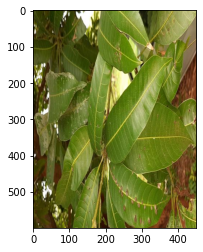

In [12]:
# And you can check your photos out, using the imread function of cv2 module.
img_arr = cv2.imread(os.path.join(data_dir,'Mango','160.jpg'))
img_arr.shape
plt.imshow(cv2.cvtColor(img_arr,cv2.COLOR_BGR2RGB))
plt.show()

## 1. Labelling and preprocessing 
We'll use tf.keras.utils utility to label our data, we can specify batch size, image, size etc.

In [13]:
tf.keras.utils.image_dataset_from_directory??
# This specifies the parameters for preprocessing.
#tf.keras.utils.image_dataset_from_directory('data', batch_size = 16, image_size = (128,128))

Signature:
tf.keras.utils.image_dataset_from_directory(
    directory,
    labels='inferred',
    label_mode='int',
    class_names=None,
    color_mode='rgb',
    batch_size=32,
    image_size=(256, 256),
    shuffle=True,
    seed=None,
    validation_split=None,
    subset=None,
    interpolation='bilinear',
    follow_links=False,
    crop_to_aspect_ratio=False,
    **kwargs,
)
Source:   
@keras_export(
    "keras.utils.image_dataset_from_directory",
    "keras.preprocessing.image_dataset_from_directory",
    v1=[],
)
def image_dataset_from_directory(
    directory,
    labels="inferred",
    label_mode="int",
    class_names=None,
    color_mode="rgb",
    batch_size=32,
    image_size=(256, 256),
    shuffle=True,
    seed=None,
    validation_split=None,
    subset=None,
    interpolation="bilinear",
    follow_links=False,
    crop_to_aspect_ratio=False,
    **kwargs,
):
    """Generates a `tf.data.Dataset` from image files in a directory.

    If your directory structure is:



In [14]:
data = tf.keras.utils.image_dataset_from_directory(os.path.join(data_dir), label_mode = "categorical")
# Bug fix
#data = tf.keras.utils.image_dataset_from_directory(os.path.join(data_dir, shuffle = False))
#data = data.shuffle(1000, seed = 100, reshuffle_each_iteration = False)

Found 357 files belonging to 3 classes.


In [15]:
# Access data as np arrays.
data_iterator = data.as_numpy_iterator()

# This is labeled data 
batch = data_iterator.next()
print(batch[0].shape, batch[1])

(32, 256, 256, 3) [[1. 0. 0.]
 [1. 0. 0.]
 [0. 0. 1.]
 [0. 0. 1.]
 [0. 1. 0.]
 [0. 0. 1.]
 [0. 0. 1.]
 [1. 0. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [0. 0. 1.]
 [0. 0. 1.]
 [0. 1. 0.]
 [0. 0. 1.]
 [1. 0. 0.]
 [1. 0. 0.]
 [0. 0. 1.]
 [0. 0. 1.]
 [0. 0. 1.]
 [0. 1. 0.]
 [0. 0. 1.]
 [1. 0. 0.]
 [1. 0. 0.]
 [0. 0. 1.]
 [0. 1. 0.]
 [0. 0. 1.]
 [0. 0. 1.]
 [1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]
 [1. 0. 0.]]


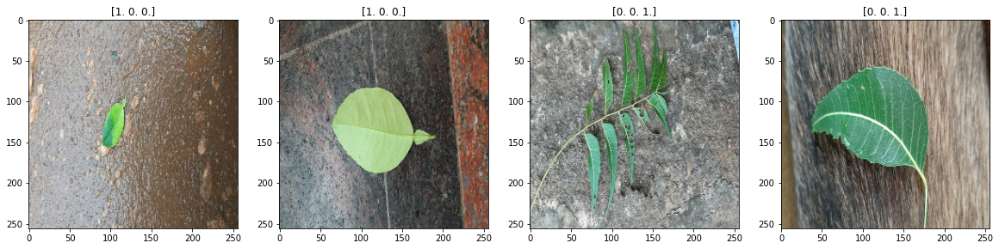

In [16]:
#Visualizing our labeled data
fig, ax = plt.subplots(ncols = 4, figsize = (20,20))

for idx, img in enumerate(batch[0][:4]):
    ax[idx].imshow(img.astype(int))
    ax[idx].title.set_text(batch[1][idx])

#[0, 0, 1] = Neem , [1,0,0] = Lemon , [0, 1, 0] = mango

In [17]:
data = data.map(lambda x,y: (x/255,y))
# This part is to ease our cpu load, and make our data small.

Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


In [18]:
scaled_iterator = data.as_numpy_iterator()
batch = scaled_iterator.next()


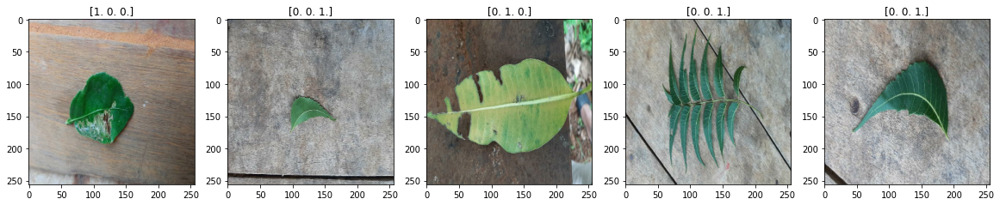

In [19]:
#Visualizing our compressed photos,(Scaled you can say, each RGB value is divided by 255)
fig, ax = plt.subplots(ncols = 5, figsize = (20,20))

for idx, img in enumerate(batch[0][:5]):
    ax[idx].imshow(img)
    ax[idx].title.set_text(batch[1][idx])
#[0, 0, 1] = Neem , [1,0,0] = Lemon , [0, 1, 0] = mango


In [20]:
len(data)

12

In [21]:
train_size = int(len(data)*0.7) -1
val_size = int(len(data)*0.2) + 1
test_size = int(len(data)*0.1) + 1
print(train_size,val_size,test_size)

7 3 2


In [22]:
train = data.take(train_size)
val = data.skip(train_size).take(val_size)
test = data.skip(train_size + val_size).take(val_size)

## 3. Building the Model
Now, we have to specify the architecture that we are going to use.

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten

In [ ]:
model = Sequential()
model.add(Conv2D(16,(3,3), 1, activation='relu',input_shape = (256,256,3)))
model.add(MaxPooling2D())

model.add(Conv2D(32,(3,3), 1, activation='relu'))
model.add(MaxPooling2D())

model.add(Conv2D(16,(3,3), 1, activation='relu'))
model.add(MaxPooling2D())

model.add(Flatten())

model.add(Dense(256,activation ='relu'))
model.add(Dense(3, activation = 'softmax'))

In [ ]:
model.compile('adam', loss = tf.losses.CategoricalCrossentropy(), metrics = ['accuracy'])

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 254, 254, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 127, 127, 16)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 32)      4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 62, 62, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 60, 60, 16)        4624      
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 30, 30, 16)       0

In [ ]:
logdir = os.path.join('log_dir')
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir = logdir)

In [ ]:
hist = model.fit(train, epochs = 40,validation_data= val, callbacks = [tensorboard_callback])

Epoch 1/40
7/7 [==============================] - 8s 851ms/step - loss: 2.1712 - accuracy: 0.3259 - val_loss: 1.0693 - val_accuracy: 0.5000
Epoch 2/40
7/7 [==============================] - 5s 715ms/step - loss: 1.0896 - accuracy: 0.3661 - val_loss: 1.0562 - val_accuracy: 0.4167
Epoch 3/40
7/7 [==============================] - 5s 726ms/step - loss: 1.0804 - accuracy: 0.4911 - val_loss: 1.0723 - val_accuracy: 0.6979
Epoch 4/40
7/7 [==============================] - 5s 730ms/step - loss: 1.0382 - accuracy: 0.5312 - val_loss: 0.9698 - val_accuracy: 0.6354
Epoch 5/40
7/7 [==============================] - 5s 709ms/step - loss: 1.0367 - accuracy: 0.4688 - val_loss: 0.9332 - val_accuracy: 0.7812
Epoch 6/40
7/7 [==============================] - 5s 692ms/step - loss: 0.9102 - accuracy: 0.6027 - val_loss: 0.8275 - val_accuracy: 0.7708
Epoch 7/40
7/7 [==============================] - 5s 670ms/step - loss: 0.7957 - accuracy: 0.7277 - val_loss: 0.8191 - val_accuracy: 0.6458
Epoch 8/40
7/7 [====

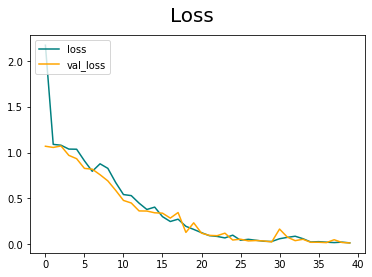

In [ ]:
# Plotting loss, and accuracy with epochs
fig = plt.figure()
plt.plot(hist.history['loss'],color='teal',label = 'loss')
plt.plot(hist.history['val_loss'],color='orange',label = 'val_loss')
fig.suptitle('Loss', fontsize = 20)
plt.legend(loc = 'upper left')
plt.show()

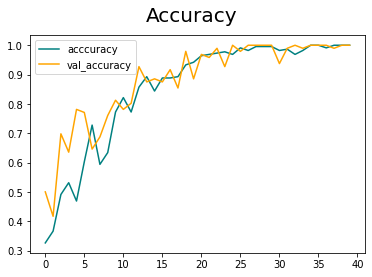

In [ ]:
fig = plt.figure()
plt.plot(hist.history['accuracy'],color='teal',label = 'acccuracy')
plt.plot(hist.history['val_accuracy'],color='orange',label = 'val_accuracy')
fig.suptitle('Accuracy', fontsize = 20)
plt.legend(loc = 'upper left')
plt.show()

## 4. Evaluating Accuracy
Evaluating the model on predefined metrics from tensorflow.keras.metrics

In [ ]:
from tensorflow.keras.metrics import Precision, Recall, BinaryAccuracy
pre = Precision()
re = Recall()
acc = BinaryAccuracy()

In [ ]:
for batch in test.as_numpy_iterator():
    X,y = batch
    yhat = model.predict(X)
    pre.update_state(y,yhat)
    re.update_state(y,yhat)
    acc.update_state(y,yhat)

1/1 [==============================] - 0s 75ms/step


In [ ]:
print(f'Precision:{pre.result().numpy()}, Recall:{re.result().numpy()}, Accuracy:{acc.result().numpy()}')

Precision:1.0, Recall:1.0, Accuracy:1.0


## 5. Testing 
Testing the model with self-clicked photos. Also, photos from internet, in the test directory.

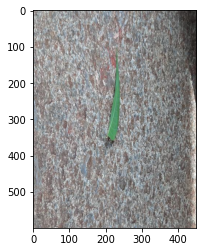

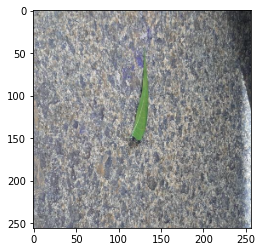

In [ ]:
# Testing from training data just as a check
img = cv2.imread(os.path.join(data_dir, 'Neem', '1000.jpg'))
plt.imshow(img)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.show()
resize = tf.image.resize(img, (256,256))
plt.imshow(resize.numpy().astype(int))
plt.show()


In [ ]:
value = model.predict(np.expand_dims(resize/255, 0))

1/1 [==============================] - 0s 28ms/step


In [ ]:
# This gives the index of the label array. (predicting the label)
np.argmax(value) # 0 - Lemon, 1 - Mango , 2 - Neem

2

## 6. Saving the model 
To save ourselves from the training time.

In [25]:
from tensorflow.keras.models import load_model

In [ ]:
model.save(os.path.join('models','LeafClassifier.h5'))

In [26]:
new_model = load_model(os.path.join('models','Leafclassifier.h5'))

1/1 [==============================] - 0s 176ms/step


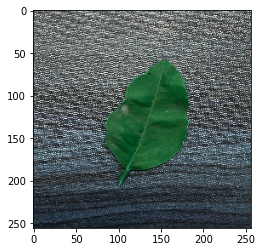

1
1/1 [==============================] - 0s 25ms/step


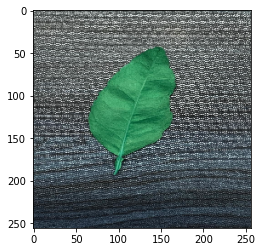

0
1/1 [==============================] - 0s 20ms/step


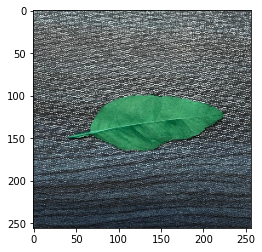

1
1/1 [==============================] - 0s 55ms/step


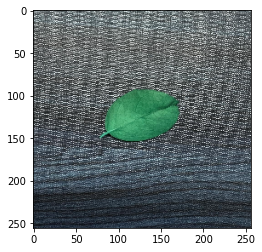

0
1/1 [==============================] - 0s 25ms/step


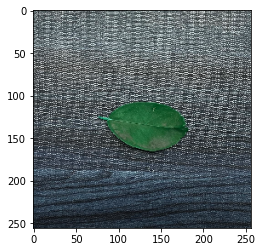

2
1/1 [==============================] - 0s 24ms/step


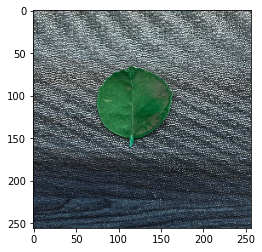

0
1/1 [==============================] - 0s 27ms/step


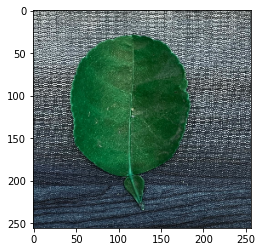

1
1/1 [==============================] - 0s 22ms/step


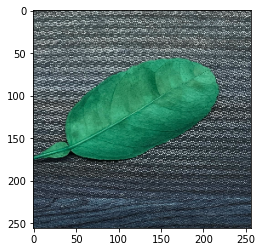

1
1/1 [==============================] - 0s 24ms/step


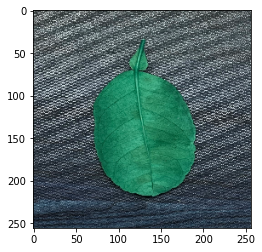

0
1/1 [==============================] - 0s 21ms/step


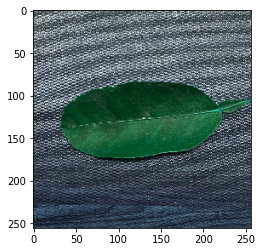

1
1/1 [==============================] - 0s 23ms/step


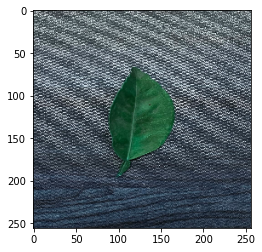

0
1/1 [==============================] - 0s 21ms/step


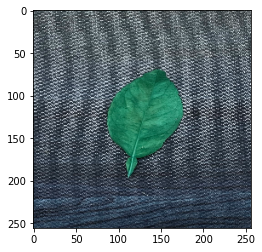

0
1/1 [==============================] - 0s 24ms/step


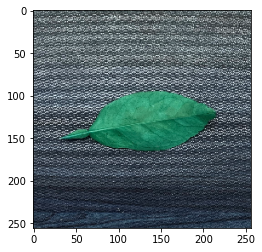

1
1/1 [==============================] - 0s 21ms/step


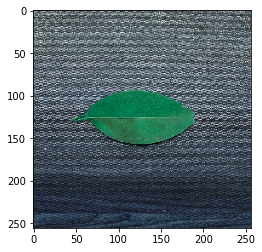

0
1/1 [==============================] - 0s 25ms/step


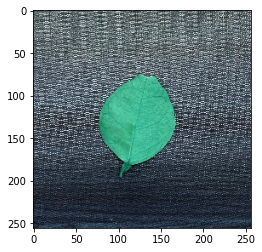

0
1/1 [==============================] - 0s 23ms/step


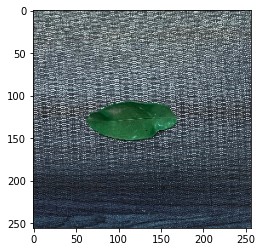

2
1/1 [==============================] - 0s 25ms/step


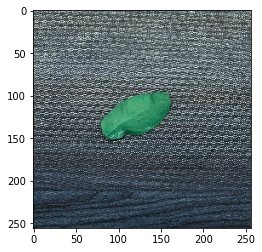

2
1/1 [==============================] - 0s 22ms/step


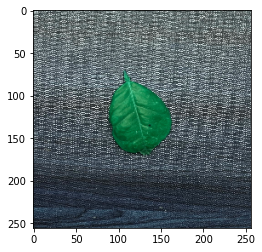

0
1/1 [==============================] - 0s 24ms/step


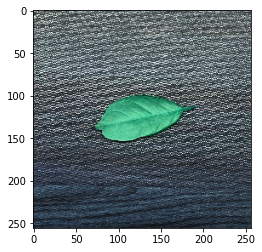

0
1/1 [==============================] - 0s 22ms/step


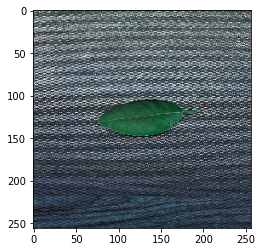

2
1/1 [==============================] - 0s 28ms/step


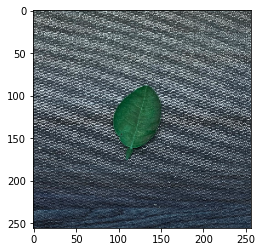

2
1/1 [==============================] - 0s 22ms/step


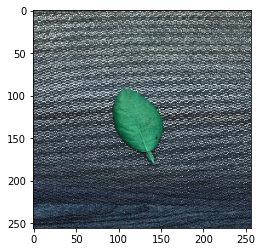

0
1/1 [==============================] - 0s 29ms/step


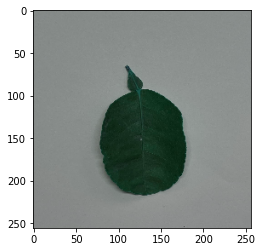

2
1/1 [==============================] - 0s 21ms/step


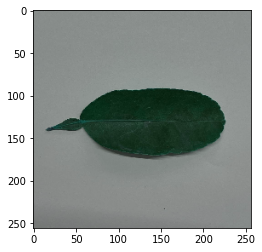

2
1/1 [==============================] - 0s 21ms/step


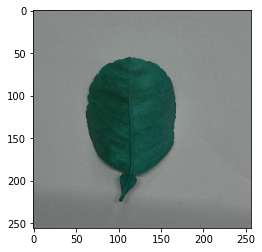

2
1/1 [==============================] - 0s 30ms/step


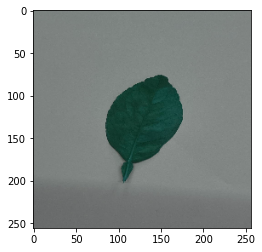

2
1/1 [==============================] - 0s 22ms/step


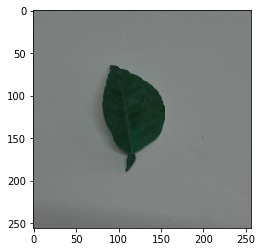

2
1/1 [==============================] - 0s 26ms/step


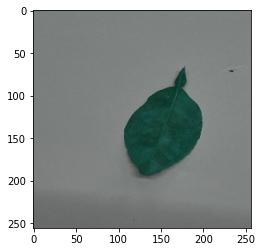

2
1/1 [==============================] - 0s 22ms/step


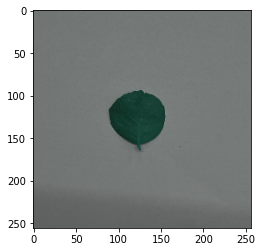

2
1/1 [==============================] - 0s 31ms/step


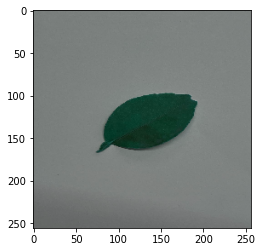

2
1/1 [==============================] - 0s 22ms/step


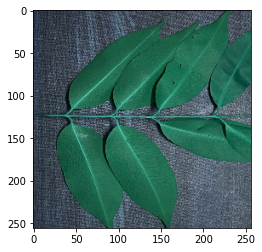

1
1/1 [==============================] - 0s 26ms/step


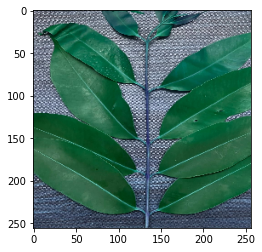

1
1/1 [==============================] - 0s 23ms/step


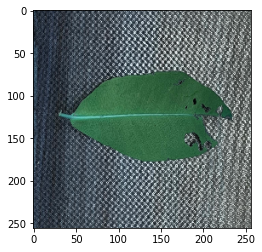

1
1/1 [==============================] - 0s 21ms/step


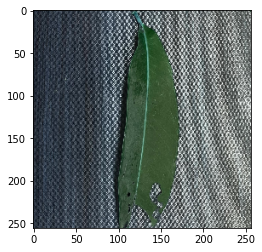

0
1/1 [==============================] - 0s 26ms/step


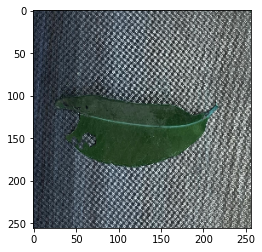

1
1/1 [==============================] - 0s 21ms/step


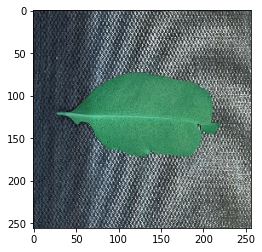

1
1/1 [==============================] - 0s 28ms/step


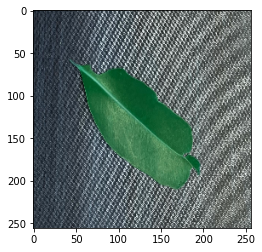

1
1/1 [==============================] - 0s 22ms/step


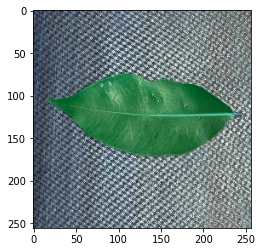

1
1/1 [==============================] - 0s 22ms/step


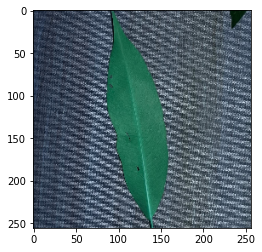

0
1/1 [==============================] - 0s 27ms/step


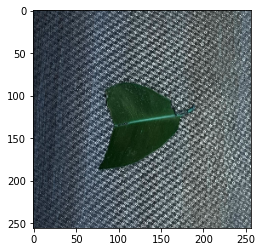

2
1/1 [==============================] - 0s 29ms/step


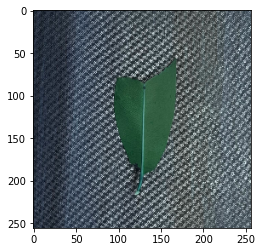

0
1/1 [==============================] - 0s 25ms/step


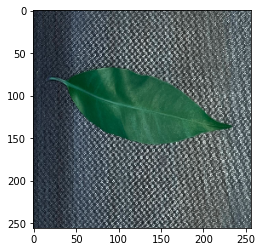

1
1/1 [==============================] - 0s 25ms/step


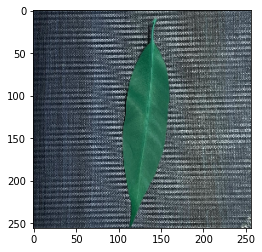

2
1/1 [==============================] - 0s 28ms/step


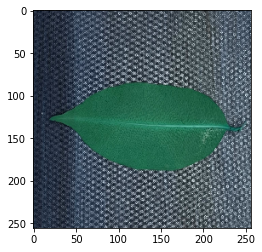

1
1/1 [==============================] - 0s 21ms/step


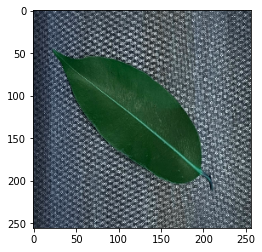

1
1/1 [==============================] - 0s 23ms/step


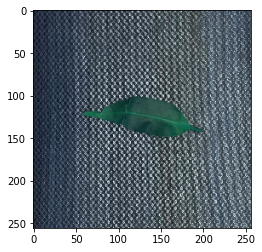

2
1/1 [==============================] - 0s 33ms/step


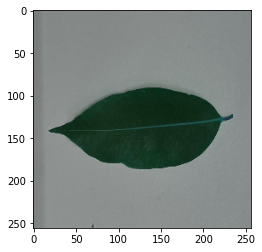

1
1/1 [==============================] - 0s 31ms/step


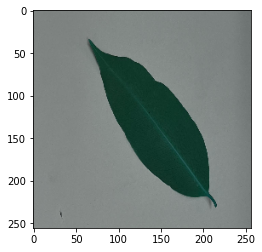

2
1/1 [==============================] - 0s 31ms/step


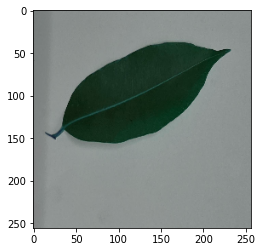

2
1/1 [==============================] - 0s 33ms/step


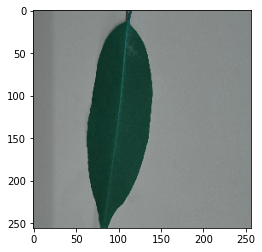

1
1/1 [==============================] - 0s 31ms/step


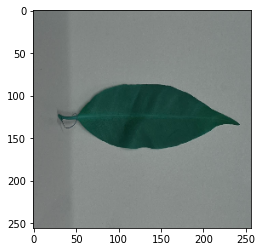

2
1/1 [==============================] - 0s 33ms/step


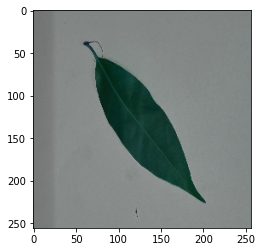

2
1/1 [==============================] - 0s 27ms/step


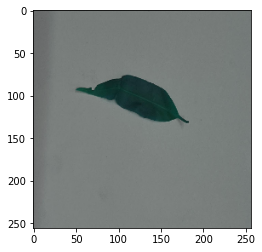

2
1/1 [==============================] - 0s 22ms/step


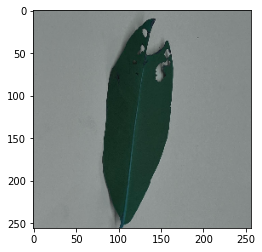

2
1/1 [==============================] - 0s 24ms/step


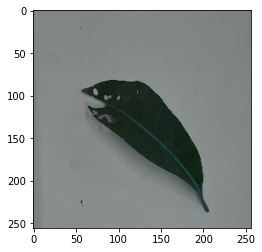

2
1/1 [==============================] - 0s 23ms/step


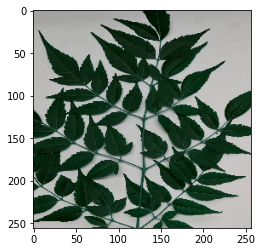

2
1/1 [==============================] - 0s 29ms/step


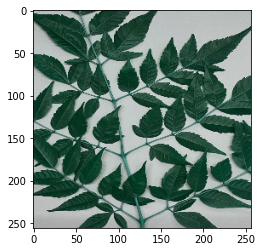

1
1/1 [==============================] - 0s 34ms/step


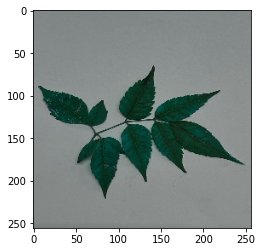

2
1/1 [==============================] - 0s 28ms/step


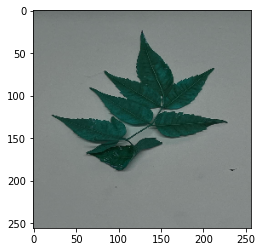

2
1/1 [==============================] - 0s 25ms/step


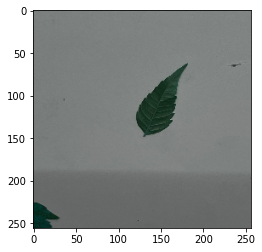

2
1/1 [==============================] - 0s 22ms/step


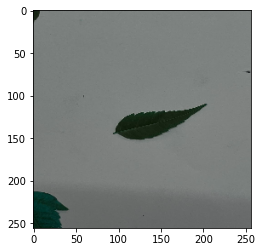

2
1/1 [==============================] - 0s 23ms/step


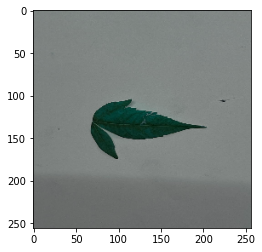

2
1/1 [==============================] - 0s 31ms/step


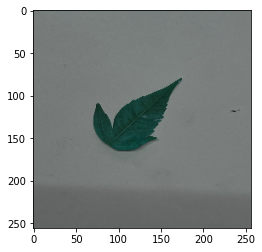

2
1/1 [==============================] - 0s 27ms/step


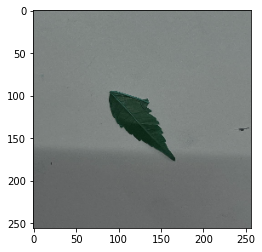

2
1/1 [==============================] - 0s 27ms/step


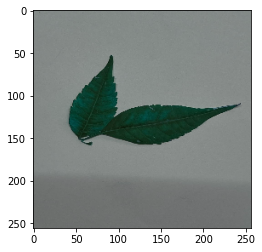

2
1/1 [==============================] - 0s 27ms/step


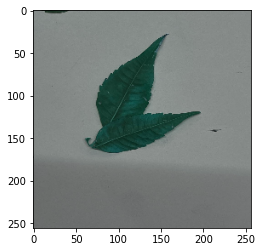

2
1/1 [==============================] - 0s 27ms/step


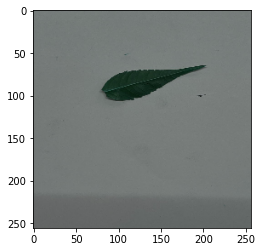

2
1/1 [==============================] - 0s 30ms/step


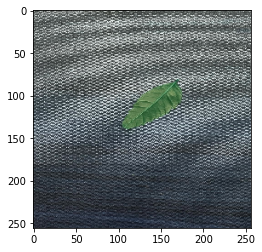

2
1/1 [==============================] - 0s 29ms/step


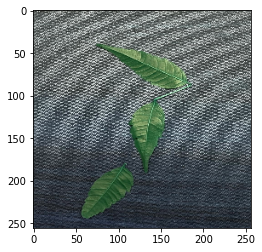

2
1/1 [==============================] - 0s 25ms/step


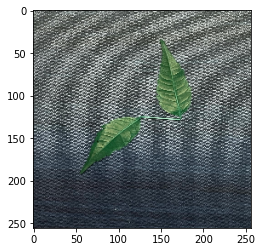

2
1/1 [==============================] - 0s 22ms/step


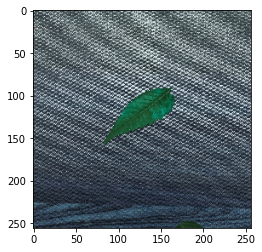

2
1/1 [==============================] - 0s 24ms/step


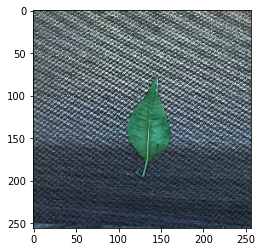

2
1/1 [==============================] - 0s 24ms/step


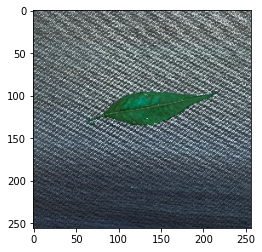

2
1/1 [==============================] - 0s 25ms/step


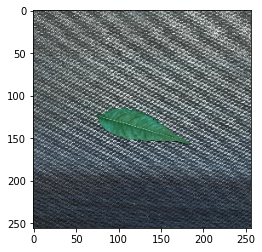

2
1/1 [==============================] - 0s 25ms/step


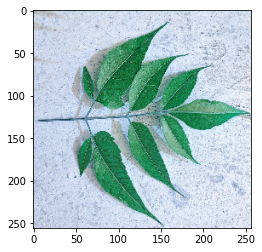

0
1/1 [==============================] - 0s 35ms/step


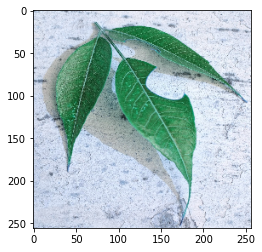

2
1/1 [==============================] - 0s 23ms/step


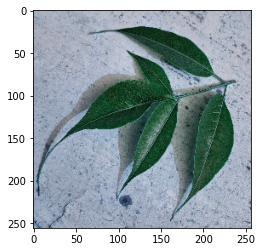

2
1/1 [==============================] - 0s 29ms/step


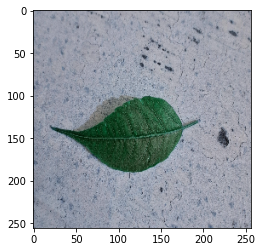

1


In [ ]:
predictions = []
paths = []
counts = 0
for image in os.listdir(os.path.join('Test', 'Self')):
        image_path = os.path.join('Test', 'Self', image)
        img = cv2.imread(image_path)
        resize = tf.image.resize(img, (256,256))
        value = new_model.predict(np.expand_dims(resize/255, 0))
        plt.imshow(resize.numpy().astype(int))
        plt.show()
        a = np.argmax(value)
        print(a)
        predictions.append(a)
        paths.append(image)
        counts+=1
# 0 - Lemon , 1 - Mango , 2- Neem
# First 30 images are Lemons, next 25 are Mangoes, Next 23 are Neems

In [42]:
counts
print(predictions, paths)
''' Now, I know that first 30 images in the "predictions" list are 
Lemon, then next 25 are mangos and last 23 are neem'''
print(len(predictions))

[1, 0, 1, 0, 2, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 2, 2, 0, 0, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 0, 1, 1, 1, 1, 0, 2, 0, 1, 2, 1, 1, 2, 1, 2, 2, 1, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 1] ['IMG-20241107-WA0047.jpg', 'IMG-20241107-WA0048.jpg', 'IMG-20241107-WA0049.jpg', 'IMG-20241107-WA0050.jpg', 'IMG-20241107-WA0051.jpg', 'IMG-20241107-WA0052.jpg', 'IMG-20241107-WA0053.jpg', 'IMG-20241107-WA0054.jpg', 'IMG-20241107-WA0055.jpg', 'IMG-20241107-WA0056.jpg', 'IMG-20241107-WA0057.jpg', 'IMG-20241107-WA0058.jpg', 'IMG-20241107-WA0059.jpg', 'IMG-20241107-WA0060.jpg', 'IMG-20241107-WA0061.jpg', 'IMG-20241107-WA0062.jpg', 'IMG-20241107-WA0063.jpg', 'IMG-20241107-WA0064.jpg', 'IMG-20241107-WA0065.jpg', 'IMG-20241107-WA0066.jpg', 'IMG-20241107-WA0067.jpg', 'IMG-20241107-WA0068.jpg', 'IMG-20241107-WA0069.jpg', 'IMG-20241107-WA0070.jpg', 'IMG-20241107-WA0071.jpg', 'IMG-20241107-WA0072.jpg', 'IMG-20241107-WA0073.jpg', 'IMG-20241107-WA0074.jpg', 'IMG-202

In [65]:
Lemon_predicted = predictions[:30]
Mango_predicted = predictions[30:55]
Neem_predicted = predictions[55:]
print(len(Lemon_predicted), len(Mango_predicted), len(Neem_predicted))

#Now, we can just match these lists with corresponding lists containing, 0 ,1 ,2
Lemon_true = [0]*30
Mango_true = [1]*25
Neem_true = [2]*23

print(len(Lemon_true))

30 25 23
30


In [66]:
wrong_predictions_Lemon = 0
for i in range(0,29):
    if Lemon_predicted[i] != Lemon_true[i]:
        wrong_predictions_Lemon+=1
print(wrong_predictions_Lemon)

18


In [67]:
wrong_predictions_Mango = 0
for i in range(0,24):
    if Mango_predicted[i] != Mango_true[i]:
        wrong_predictions_Mango+=1
print(wrong_predictions_Mango)

12


In [68]:
wrong_predictions_Neem = 0
for i in range(0,22):
    if Neem_predicted[i] != Neem_true[i]:
        wrong_predictions_Neem+=1
print(wrong_predictions_Neem)

2


## Conclusions
Our model has gotten pretty good at predicting neem leaves (maybe because of them being small and pretty distinctive from the other two), but also has overfitted the training data. Which is why it confuses small leaves to be neem. We need to introduce regularization into our model & other biasing to make it useful in general.

A better training dataset is also needed.